<a href="https://colab.research.google.com/github/Ivano05/Clasificador-perros-y-gatos/blob/main/Clasificador_perros_vs_gatos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
#Importo tensorflow y tensorflow dataset
import tensorflow as tf
import tensorflow_datasets as tfds


In [9]:
#Importo un set de datos de perros y gatos que esta en el sitio de TensorFlow datasets
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)


In [10]:
#Analizo el set de datos imprimiendo las caracteristicas de los metadatos
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='~/tensorflow_datasets/cats_vs_dogs/4.0.0',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and

# **Visualizacion de los datos 3 opciones:**

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

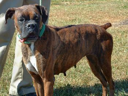
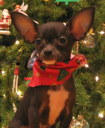
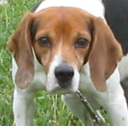
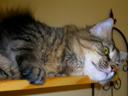
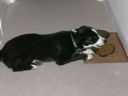

In [11]:
# 1) Usar as_dataframe de TensorFlow - en el ejemplo le pido que quiero 5 de los datos que bajamos con la etiqueta
tfds.as_dataframe(datos['train'].take(5), metadatos)

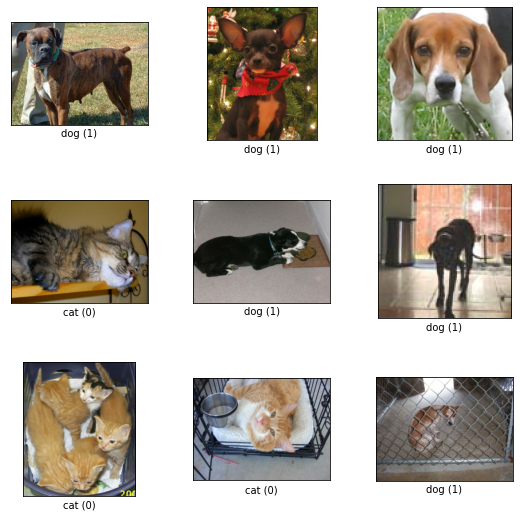

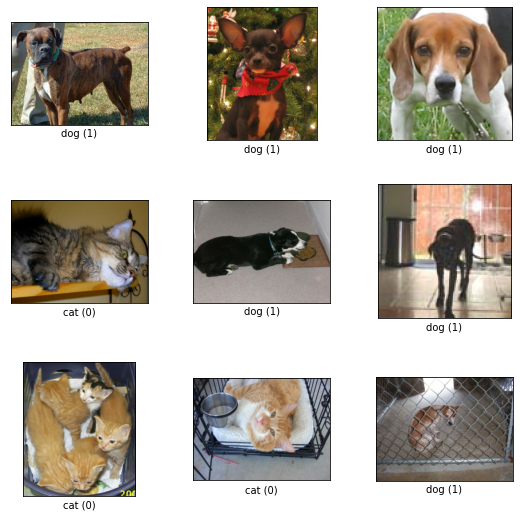

In [12]:
#2) Puedo usar show_examples que me pone la etiqueta abajo
tfds.show_examples(datos['train'], metadatos)

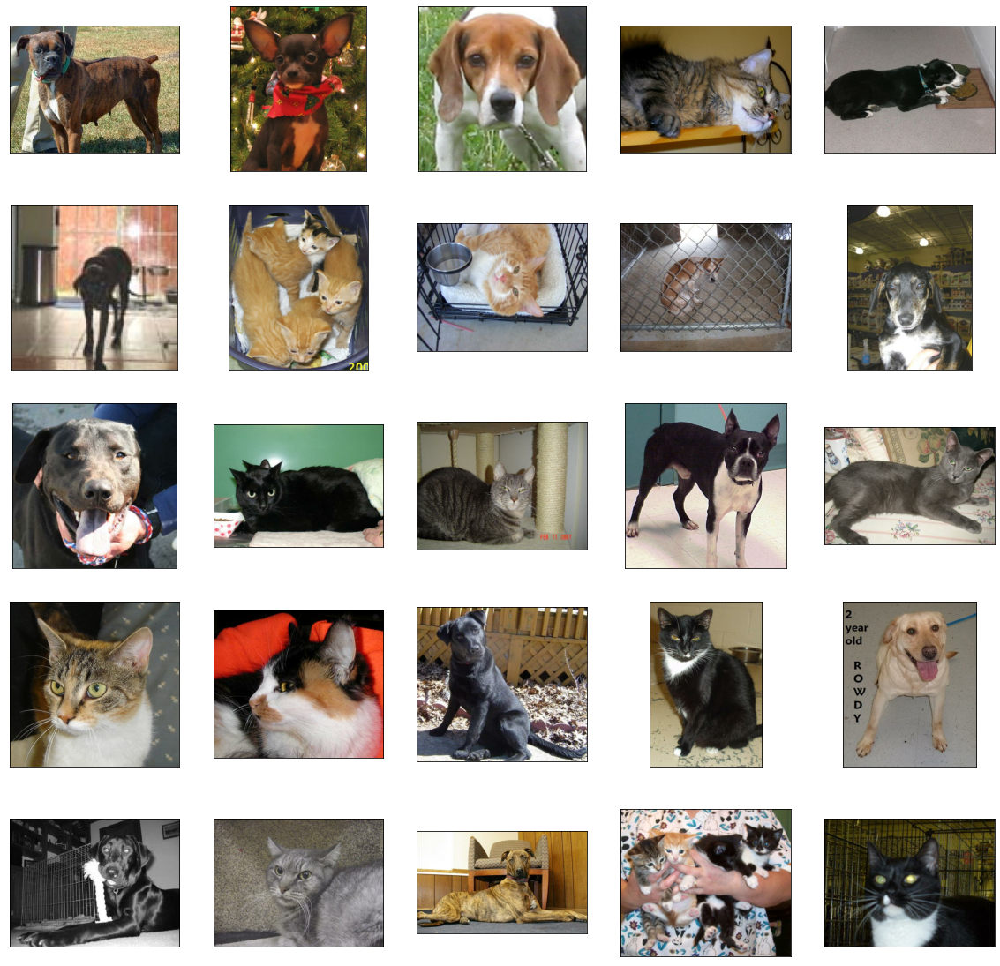

In [14]:
#3) Para tener mejor control de los datos es mejor usar matplotlib. Lo que se va a hacer es iterar por los datos, agrego una iteracion que recibe el Nº de 
# indice y el par dato-etiqueta y le paso el dato que quiero mostrar por take, con la funcion imshow muestro la imagen. Hasta aquí solo me sirve para mostrar 
#una imagen para mostrar varias imagenes agrego plt.subplot y le paso la cantidad de filas, la cantidad de columnas
#La funcion figure me va permitir cambiar el tamañano de las imagenes, asi puedo buscar una mejor visualizacion de las mismas 
#al costado izquierdo y debajo de cada imagen figura una escala es decir en el eje Y y el eje X, como no sirven a los fines de la visualizacion las podemos
#quitar agregando xticks para sacar la de las x y dando un valor vacio ([]) e yticks([]) para las y
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5,5, i+1)
  plt.yticks([])
  plt.xticks([])
  plt.imshow(imagen)


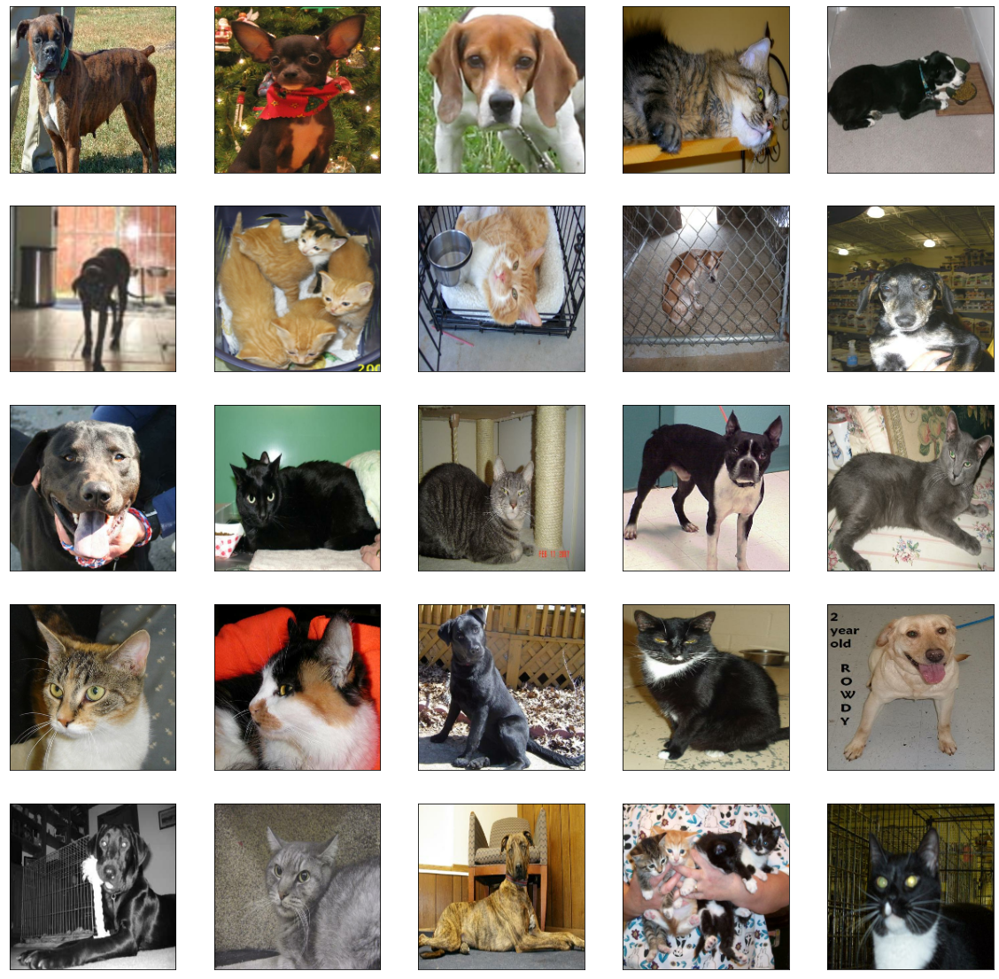

In [16]:
#Las imagenes anteriores tienen distintos tamaños algunas verticales otras horizontales etc y necesitamos que tengan el mismo ya que la red neuronal va a 
# tener una cantidad fija de neuronas de entrada.
# Para redimensionar voy a importar la libreria CV2 y de esta libreria uso la funcion Resize()
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=200

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  plt.subplot(5,5, i+1)
  plt.yticks([])
  plt.xticks([])
  plt.imshow(imagen)

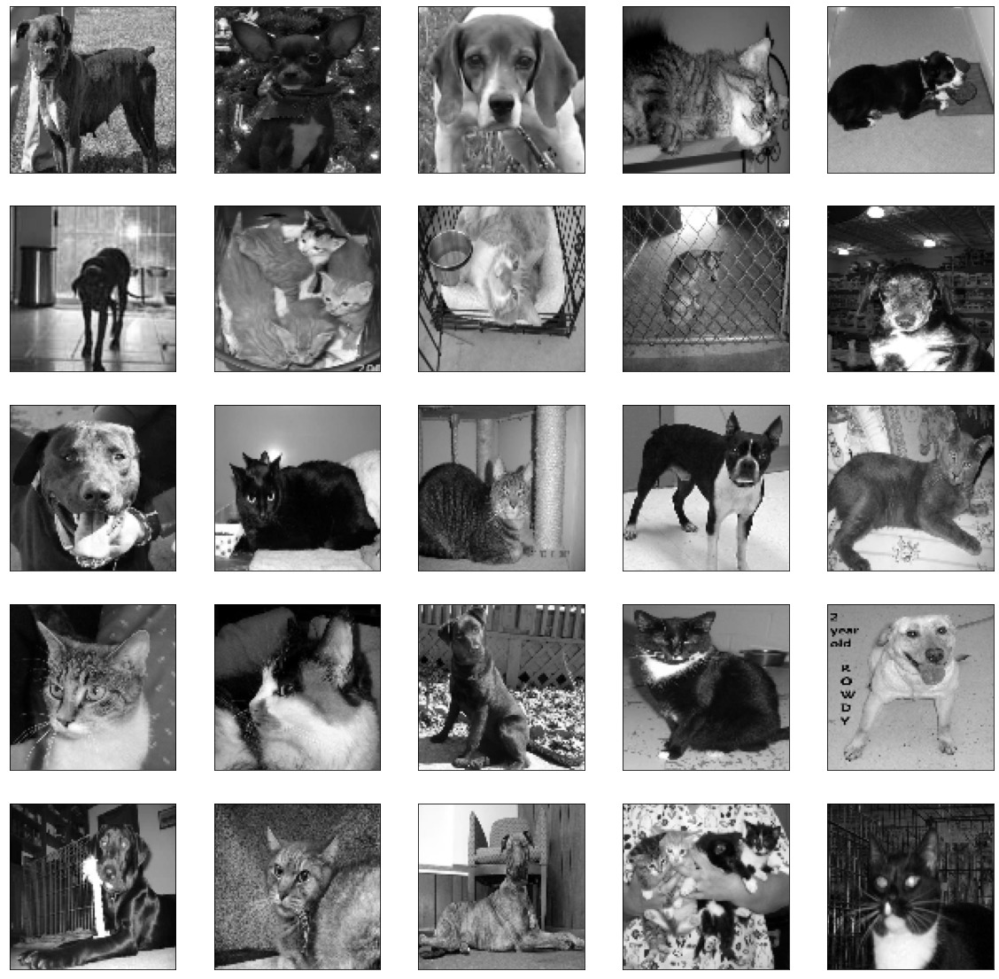

In [18]:
#para manejarlo mejor voy a pasarlo a blanco y negro y para esto voy a usar la funcion cvtColor de CV2. Y en imshow agrego el parametro cmap para determinar 
# 1 solo canal.
#Mientras mas grandes son las imagenes mas tarda la red en entrenar y predecir, por eso hay que buscar un tamaño lo mas pequeño posible pero sin perder
#calidad o detalles. Lo cambio en la variable TAMANO_IMG que definí

import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5,5, i+1)
  plt.yticks([])
  plt.xticks([])
  plt.imshow(imagen, cmap='gray')

In [19]:
#Creo una variable llamada datos de entrenamiento que va a ser una lista simple, y voy a iterar en todos los datos de entrenamiento agregando las imagenes
#que ya modifique al arreglo.
#Agrego la modificacion en el tamaño de la imagen y debo agregar que las imagenes solo tienen un canal de color

datos_entrenamiento =[]

for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen =imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen,etiqueta])



In [20]:
# La variable datos_entrenamiento contiene un arreglo con todos los datos ya transformados, puedo imprimir el primer indice, por ejemplo, y lo que voy a ver 
#y voy a ver el tamñano de todos los pixeles que van de 0 a 255. al final voy a encontrar el valor o o 1 que en este set de datos 1 es perro y 0 gato, 
#por lo que la imagen es de un perro
datos_entrenamiento[3]

[array([[[52],
         [54],
         [54],
         ...,
         [76],
         [73],
         [71]],
 
        [[52],
         [54],
         [55],
         ...,
         [76],
         [75],
         [73]],
 
        [[51],
         [53],
         [56],
         ...,
         [77],
         [76],
         [73]],
 
        ...,
 
        [[25],
         [25],
         [25],
         ...,
         [83],
         [79],
         [71]],
 
        [[24],
         [24],
         [25],
         ...,
         [82],
         [79],
         [70]],
 
        [[25],
         [25],
         [25],
         ...,
         [82],
         [78],
         [70]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=0>]

In [21]:
#Para ver si estan todos los datos en el arreglo puedo imprimir la longitud del arreglo
len(datos_entrenamiento)

23262

In [22]:
#preparo mejor los datos para el entrenamiento
# Para eso creo una variable X que van a ser todas las imagenes de entrada en pixeles y la variable y va a ser las etiquetas de si es perro o 
#gato
# se hace una iteracion para que cada variable tenga los valores correspondientes
X=[]
y=[]

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)


In [23]:
# Normalizo los datos.
# Si imprimo X voy a obtener los pixeles de las imagenes pero que van a estar entre 0 y 255, para que este normalizada entre 0 y 1. La normalizacion
# la hago con numpy convirtiendo a todo el set en un arreglo de numpy y lo hago flotante para tener los decimales y lo divido entre 255.

import numpy as np
X = np.array(X).astype(float) / 255

X


array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [24]:

# Si imprimo la Y voy a tener tensores, para convertirlo en un arreglo simple de 0 y 1 donde sear 0 gato 1 perro uso numpy

y = np.array(y)

y

array([1, 1, 1, ..., 0, 1, 0])

In [27]:
#Imprimo la forma de la X con shape. En el ejemplo significa que el arreglo tiene 23262 entradas cada una con un tamañó de 100 x 100 con un canal de
# color
X.shape

(23262, 100, 100, 1)

# **Modelos**

In [29]:
# 1) El primer modelo solo tendra capa de entrada recibiendo los 10k pixeles, dos capas densas de 150 neuronas cada una con funcion de activacion
#  relu y una capa de salida con 1 neurona (es perro o gato) con una funcion de activacion sigmoide para que siempre de un valor entre 0 y 1

modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
     ])
# 2) El segundo modelo es una red neuronal convolucional. Para este modelo se van a agregar 3 pares de capas convolucionales
# y de agrupacion maxima pasando por una capa de 32, otra de 64, otra de 128 filtros. Y finalmente una capa densa de 100 neuronas
# y la salida con sigmoide      

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])                                      
                                          
# El tercer modelo es una red convolucional pero a la que le agrego un dropout de 0.5 antes de la capa densa 
#a la que le pongo 250 neuronas                                   

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])                                  
#**********************************PARA QUE UN DROPOUT******************************************#
# Dropout es un metodo que desactiva un numero de neuronas de una red neuronal de forma aleatoria. 
# En cada iteración de la red neuronal dropout desactivara diferentes neuronas, las neuronas desactivadas no se toman 
# en cuenta para el forwardpropagation ni para el backwardpropagation lo que obliga a las neuronas cercanas a no depender tanto 
# de las neuronas desactivadas. Este metodo ayuda a reducir el overfitting ya que las neuronas cercanas suelen aprender patrones 
#que se relacionan y estas relaciones pueden llegar a formar un patron muy especifico con los datos de entrenamiento, con dropout 
# esta dependencia entre neuronas es menor en toda la red neuronal, de esta manera la neuronas necesitan trabajar mejor de forma 
#solitaria y no depender tanto de las relaciones con las neuronas vecinas.

# Dropout tiene un parametro que indica la probabilidad de que las neuronas se queden activadas, este paremetro toma 
# valores de 0 a 1, 0.5 suele usarse por defecto indicando que la mitad de las neuronas se quedaran activadas
                                         

In [30]:
# Compilo los modelos con el optimizador "adam" y la funcion de perdida "binary_crossentroppy" porque aplica para resultados binarios, y la metrica de 
#  presicion accuracy

modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])



In [31]:
from tensorflow.keras.callbacks import TensorBoard # Agrego una librería para usar TensorBoard

# Antes de entrenar el modelo voy a crear una variable a la que voy a llamar tensorboardDenso y le voy a dar el nombre de una carpeta. Tengo que crear
#  una carpeta distinta para cada modelo, a las que voy a dejar dentro de logs

tensorboardDenso = TensorBoard(log_dir='logs/denso')
#Entreno el modelo con la funcion fit y le paso la X que son las imagenes y la y que son las etiquetas un tamaño de lote. En este caso no tengo separados
#  los datos de entrenamiento y prueba ya que es solamente un set grande pero le puedo pasar que porcentaje quiero dejar para pruebas en el ejemplo tomaré
#  un 15% luego le paso los epochs y finalmente agrego un arreglo de callbacks. El callbacks lo agrego para que despues de cada epochs llame a la funcion 
#  y la funcion va a guardar el resultado en disco de cada epochs y al terminar lo deja todo en un archivo que luego puedo utiliar para verlo en tensorboard

modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso]) 

Epoch 1/100
618/618 [==============================] - 6s 5ms/step - loss: 0.7138 - accuracy: 0.5547 - val_loss: 0.6763 - val_accuracy: 0.5837
Epoch 2/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6731 - accuracy: 0.5791 - val_loss: 0.6819 - val_accuracy: 0.5842
Epoch 3/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6676 - accuracy: 0.5892 - val_loss: 0.6675 - val_accuracy: 0.5926
Epoch 4/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6655 - accuracy: 0.5933 - val_loss: 0.6674 - val_accuracy: 0.5946
Epoch 5/100
618/618 [==============================] - 5s 7ms/step - loss: 0.6621 - accuracy: 0.6017 - val_loss: 0.6823 - val_accuracy: 0.5779
Epoch 6/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6612 - accuracy: 0.6014 - val_loss: 0.6779 - val_accuracy: 0.5673
Epoch 7/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6588 - accuracy: 0.6108 - val_loss: 0.6709 - val_accuracy: 0.5983

In [32]:
# Para ver el entrenamiento en tensorBoard exporto un comando especial en colab con el simbolo de % y de esta forma importo una extencion que tiene Colab
#  para tesorBoard

%load_ext tensorboard

In [33]:
# Ahora lanzo tensorBoard indicandolé donde esta la carpeta que tiene los logs

%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [34]:
# Ahora voy a hacer lo mismo que hice en el modelo Denso pero con el modelo convolucional

tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN]) 

Epoch 1/100
618/618 [==============================] - 16s 16ms/step - loss: 0.5989 - accuracy: 0.6627 - val_loss: 0.5135 - val_accuracy: 0.7490
Epoch 2/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4851 - accuracy: 0.7683 - val_loss: 0.4612 - val_accuracy: 0.7814
Epoch 3/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4156 - accuracy: 0.8084 - val_loss: 0.4109 - val_accuracy: 0.8117
Epoch 4/100
618/618 [==============================] - 9s 14ms/step - loss: 0.3575 - accuracy: 0.8413 - val_loss: 0.3843 - val_accuracy: 0.8269
Epoch 5/100
618/618 [==============================] - 9s 14ms/step - loss: 0.3080 - accuracy: 0.8646 - val_loss: 0.3696 - val_accuracy: 0.8350
Epoch 6/100
618/618 [==============================] - 9s 14ms/step - loss: 0.2556 - accuracy: 0.8931 - val_loss: 0.3570 - val_accuracy: 0.8410
Epoch 7/100
618/618 [==============================] - 9s 14ms/step - loss: 0.2038 - accuracy: 0.9176 - val_loss: 0.3503 - val_accuracy

In [35]:
# Entreno el tercer modelo

tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 [==============================] - 11s 16ms/step - loss: 0.6481 - accuracy: 0.6067 - val_loss: 0.5496 - val_accuracy: 0.7215
Epoch 2/100
618/618 [==============================] - 10s 16ms/step - loss: 0.5358 - accuracy: 0.7289 - val_loss: 0.4964 - val_accuracy: 0.7564
Epoch 3/100
618/618 [==============================] - 10s 16ms/step - loss: 0.4713 - accuracy: 0.7736 - val_loss: 0.4459 - val_accuracy: 0.7860
Epoch 4/100
618/618 [==============================] - 10s 16ms/step - loss: 0.4196 - accuracy: 0.8056 - val_loss: 0.3990 - val_accuracy: 0.8126
Epoch 5/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3867 - accuracy: 0.8220 - val_loss: 0.4510 - val_accuracy: 0.7894
Epoch 6/100
618/618 [==============================] - 10s 16ms/step - loss: 0.3501 - accuracy: 0.8462 - val_loss: 0.3815 - val_accuracy: 0.8350
Epoch 7/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3183 - accuracy: 0.8606 - val_loss: 0.3488 - val_acc

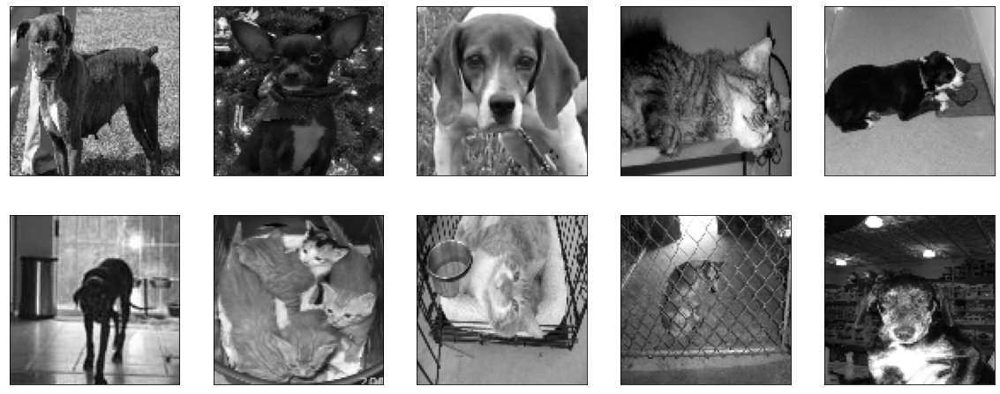

In [36]:
# Muestro las imagenes como las tengo actualmente y para eso hago una iteracion. Primero defino el tamaño con Figsize Con Subplot le pido que las ponga en dos 
#  lineas cada una de 5 imagenes
#  le saco los datos innecesarios y las muesto con imshow y con reshape aclaro que son dos dimenciones al 100
plt.figure(figsize=(20, 8)) # Le doy el tamaño que deseo
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap="gray")


# **Transformo Imagenes con aumento de datos**

TypeError: ignored

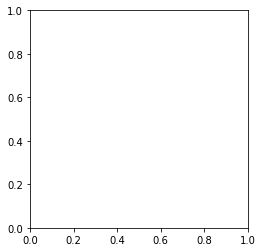

In [37]:
# Pruebas con nueva librería NO ESTA LISTO

image = next(iter(datos))
_ = plt.imshow(image)

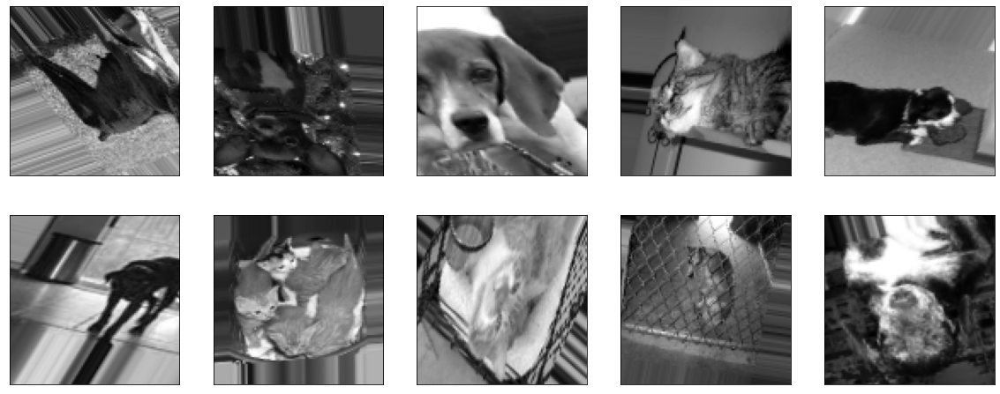

In [40]:
# Importo una libreria de keras que me da varias opciones para el aumento de datos en el entrenamiento

from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Creo un generador para utilizar las opciones de aumento de datos 
datagen = ImageDataGenerator(
    rotation_range=30, # Me sirve para rotar las imagenes y le indico el angulo máximo que se puede rotar ya que lo hace de manera aleatoria
    # Se puede usar width_shift_range para mover la imagen a los lados desde 0 a 1 ej:
    width_shift_range=.2,
    # Se puede usar height_shift_range para mover la imagen hacia arriva o abajo  ej:
    height_shift_range=.2,
    # Se puede usar shear_range para inclinar la imagen
    shear_range=15,
    # zoom_range nos permite dar un arreglo y decir que tran grande o pequeño puede ser un acercamiento definiendo un rango entre el que baja y sube
    zoom_range=[.7, 1.4],
    # vertical_flip y horzontal_flip para hacer rotaciones aleatorias vertical u horizontalmente
    horizontal_flip=True,
    vertical_flip=True
)
# A las imagenes con aumento de datos las entreno
datagen.fit(X)

# Para graficar las imagenes transformadas
plt.figure(figsize=(20, 8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")


  break



In [41]:
# Ya tenemos preparado el generador y el entrenamiento no lo vamos a hacer igual que los modelos sin aumento de datos, en vez de usar la X y la y voy a 
#  usar este generador
# Paso a crear los modelos de forma similar a los modelos sin aumento de datos.


modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100,100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid'),
     ])

modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])                                      
                                          
modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])                                  

In [42]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [43]:
# Ahora que estoy usando modelos con aumentos de datos tengo que hacer la separacion en datos de entrenamiento y datos de prueba asi que como antes use un 85%
#  para entrenamiento y un 15% para pruebas, hago un calculo para tener aproximadamente esa misma cantidad
# len(X) * .85 da 19772.7 y lo redondeo dejando para entrenamiento 19700 y al total le resto eso para calcular los de pruebas y me queda en 3562.
# Teniendo estos datos, defino dos variables para cargar la cantidad de datos que calculé

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

# En las variables anteriores cargué las imagenes y ahora hago lo mismo con las etiquetas

y_entrenamiento = y[:19700]
y_validacion = y[19700:]


In [44]:
# Ahora voy a preparar el generador de datos transformado para el entrenamiento, uso la misma función flow de arriva pero le paso las x y las y de entrenamiento
#  y defino el tamaño del lote

data_gen_entrenamiento =datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [45]:
# Para entrenar primero defino la variable de tensorboard para este entrenamiento con un nombre unico 

tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

#ahora uso la funcion fit pero le mando el generador de datos aumentados, indico las epocas el tamaño del lote, y luego le paso los datos de validacion

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    #agrego dos variables donde ponga la cantidad de datos totales dividito el tamaña del lote, tanto para entrenamiento como para validacion
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    # agrego el callback
    callbacks=[tensorboardDenso_AD]

)



Epoch 1/100
616/616 [==============================] - 22s 35ms/step - loss: 0.7258 - accuracy: 0.5003 - val_loss: 0.6903 - val_accuracy: 0.5466
Epoch 2/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6936 - accuracy: 0.4992 - val_loss: 0.6940 - val_accuracy: 0.4756
Epoch 3/100
616/616 [==============================] - 21s 35ms/step - loss: 0.6934 - accuracy: 0.4953 - val_loss: 0.6931 - val_accuracy: 0.4986
Epoch 4/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6933 - accuracy: 0.4926 - val_loss: 0.6932 - val_accuracy: 0.4980
Epoch 5/100
616/616 [==============================] - 21s 34ms/step - loss: 0.6934 - accuracy: 0.4973 - val_loss: 0.6932 - val_accuracy: 0.4980
Epoch 6/100
616/616 [==============================] - 20s 33ms/step - loss: 0.6932 - accuracy: 0.4964 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 7/100
616/616 [==============================] - 21s 34ms/step - loss: 0.6932 - accuracy: 0.5019 - val_loss: 0.6933 - val_ac

In [46]:
# este comando sirve para llamar al recolector de basura de python y de esa forma liberar memoria RAM
import gc
gc.collect()

1257

In [47]:
# entreno el primer modelo convolucional con aumento de datos, de la misma manera que el modelo denso pero haciendo los cambios correspondientes

tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]

)

Epoch 1/100
616/616 [==============================] - 25s 39ms/step - loss: 0.6858 - accuracy: 0.5513 - val_loss: 0.6845 - val_accuracy: 0.5590
Epoch 2/100
616/616 [==============================] - 23s 38ms/step - loss: 0.6731 - accuracy: 0.5834 - val_loss: 0.6526 - val_accuracy: 0.6151
Epoch 3/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6577 - accuracy: 0.6095 - val_loss: 0.6319 - val_accuracy: 0.6463
Epoch 4/100
616/616 [==============================] - 23s 37ms/step - loss: 0.6432 - accuracy: 0.6317 - val_loss: 0.6088 - val_accuracy: 0.6687
Epoch 5/100
616/616 [==============================] - 23s 37ms/step - loss: 0.6255 - accuracy: 0.6501 - val_loss: 0.5831 - val_accuracy: 0.6999
Epoch 6/100
616/616 [==============================] - 24s 39ms/step - loss: 0.6123 - accuracy: 0.6641 - val_loss: 0.5955 - val_accuracy: 0.6811
Epoch 7/100
616/616 [==============================] - 23s 37ms/step - loss: 0.5967 - accuracy: 0.6769 - val_loss: 0.5573 - val_ac

In [ ]:
# Entreno ultimo modelo
 
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]

)

In [ ]:
# Exporto modelo que elijo como mas conveniente

modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [ ]:
# Instalo tensorflowjs

!pip install tensorflowjs

In [ ]:
# Creo una carpeta para guardar el modelo

!mkdir carpeta_salida

In [ ]:
# y uso el convertidor de tensorflowjs para exportar el modelo h5 al formato de tensorflowjs para usarlo en un explorador

!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida
